In [16]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
import pandas as pd
from datetime import datetime
import numpy as np
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
import warnings
import matplotlib.pyplot as plt
df = pd.read_csv('stations_data.csv', sep=',')
def map_to_five(x):
    return min(x, 5)
df['rounded_last_update_5mins'] = pd.to_datetime(df['rounded_last_update_5mins'])
df['time_as_fraction'] = df['rounded_last_update_5mins'].dt.hour * 3600 + df['rounded_last_update_5mins'].dt.minute * 60 + df['rounded_last_update_5mins'].dt.second
df['day'] = df['rounded_last_update_5mins'].dt.day
df['month'] = df['rounded_last_update_5mins'].dt.month
weekday=df['rounded_last_update_5mins'].dt.dayofweek
weekdaydf = pd.get_dummies(weekday, prefix='day_of_week')
df = pd.concat([df, weekdaydf], axis=1)



In [17]:
x_set = df[['number','time_as_fraction','month','day','day_of_week_0','day_of_week_1','day_of_week_2','day_of_week_3','day_of_week_4','day_of_week_5','day_of_week_6','temp','feels_like']]
y_set = df['available_bike_stands']
print(x_set.shape)


(622721, 13)


In [20]:
station_number = x_set['number'].unique()
print(station_number)
x_set.columns

[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  47  48  49  50  51  52  53  54  55
  56  57  58  59  60  61  62  63  64  65  66  67  68  69  71  72  73  74
  75  76  77  78  79  80  82  83  84  85  86  87  88  89  90  91  92  93
  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108 109 110 111
 112 113 114 115 116 117]


Index(['number', 'time_as_fraction', 'month', 'day', 'day_of_week_0',
       'day_of_week_1', 'day_of_week_2', 'day_of_week_3', 'day_of_week_4',
       'day_of_week_5', 'day_of_week_6', 'temp', 'feels_like'],
      dtype='object')

In [21]:
def r_squared(y_true, y_pred):
   
    residual_sum_of_squares = np.sum(np.square(y_true - y_pred))
    total_sum_of_squares = np.sum(np.square(y_true - np.mean(y_true)))
    return 1 - (residual_sum_of_squares / total_sum_of_squares)

0.9245838056715349
51.592689295039165
<class 'pandas.core.frame.DataFrame'> 1915 1915


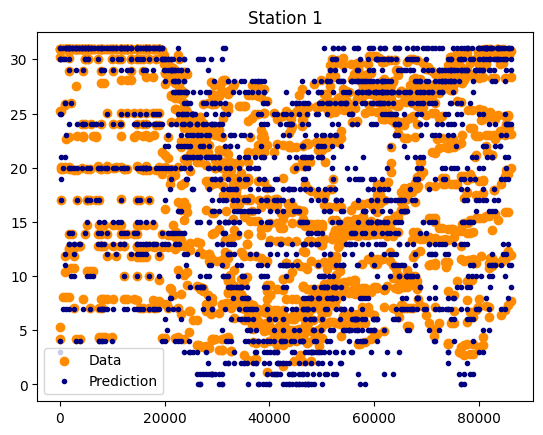

0.9432910060702328
73.02052785923753
<class 'pandas.core.frame.DataFrame'> 1705 1705


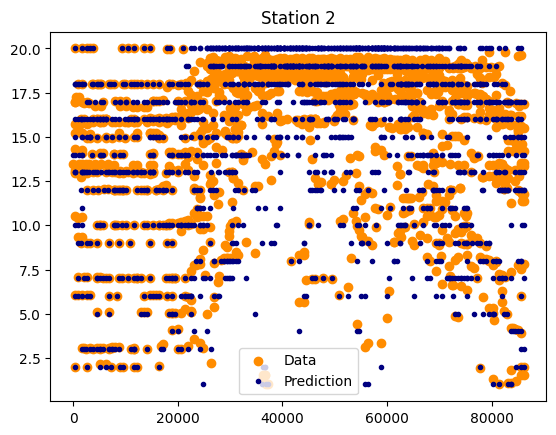

0.9437101244073369
65.68946796959825
<class 'pandas.core.frame.DataFrame'> 1842 1842


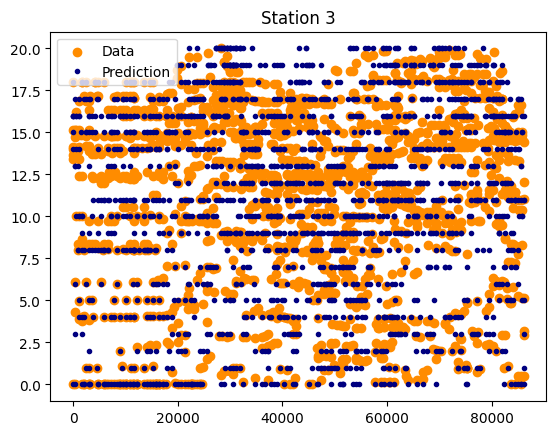

0.9591227860998303
79.04929577464789
<class 'pandas.core.frame.DataFrame'> 1704 1704


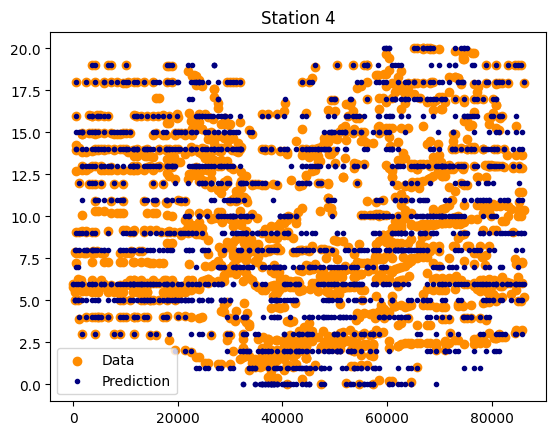

0.9629038394341732
47.36590038314176
<class 'pandas.core.frame.DataFrame'> 2088 2088


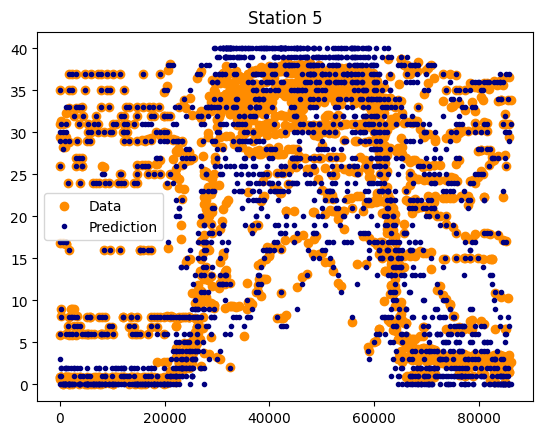

0.961138976936676
72.58709308966304
<class 'pandas.core.frame.DataFrame'> 1751 1751


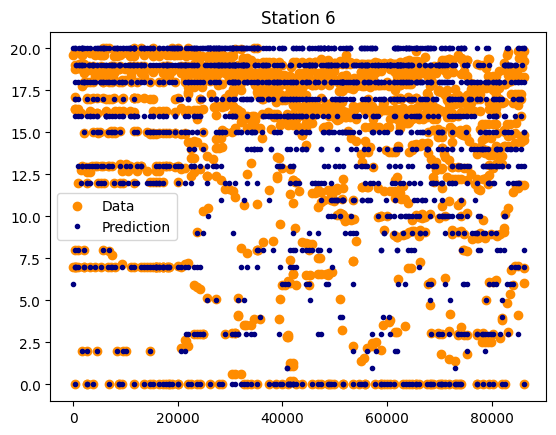

0.9388216804909169
68.38671411625148
<class 'pandas.core.frame.DataFrame'> 1686 1686


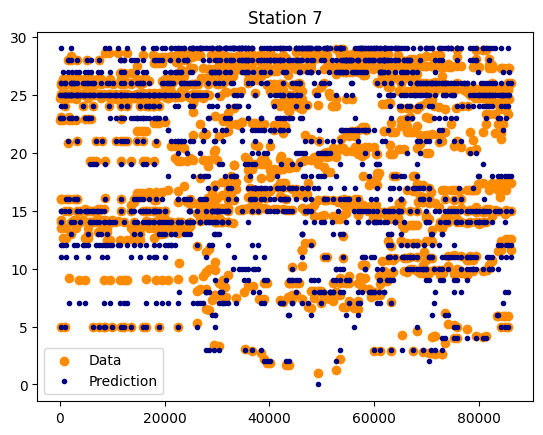

0.9291400312101176
55.65610859728507
<class 'pandas.core.frame.DataFrame'> 1989 1989


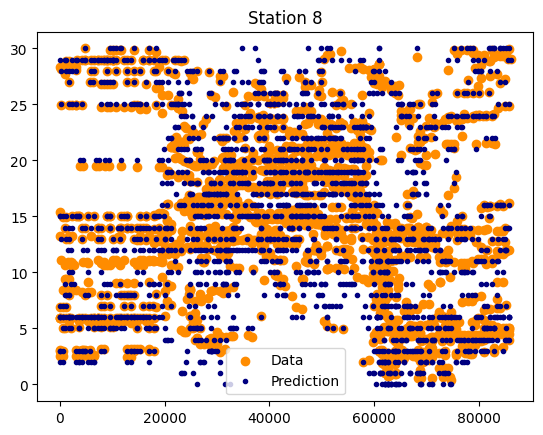

0.8593036075891822
50.98795180722892
<class 'pandas.core.frame.DataFrame'> 2075 2075


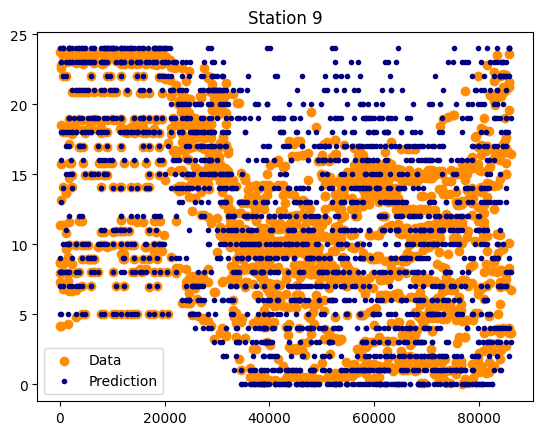

0.8719823776172022
65.77540106951871
<class 'pandas.core.frame.DataFrame'> 1870 1870


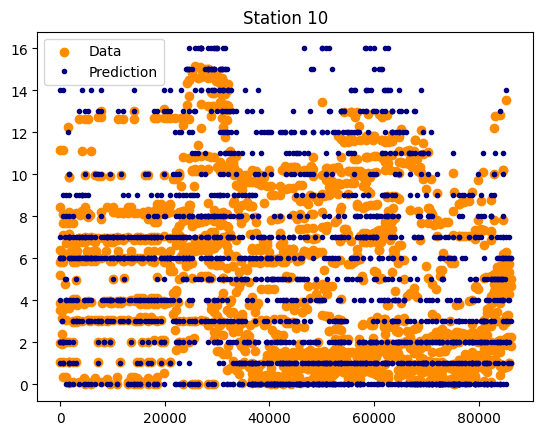

0.9665035695905022
80.54729327781082
<class 'pandas.core.frame.DataFrame'> 1681 1681


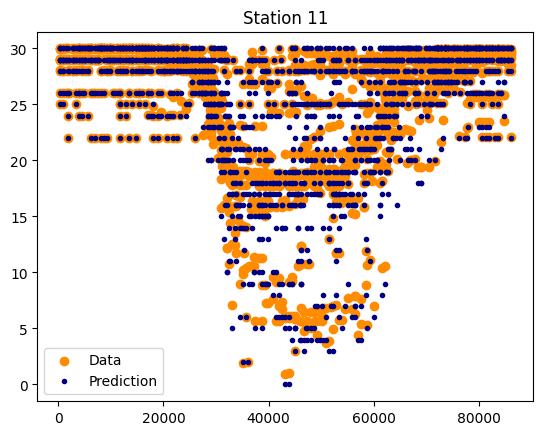

0.9382321797176079
75.62574493444578
<class 'pandas.core.frame.DataFrame'> 1678 1678


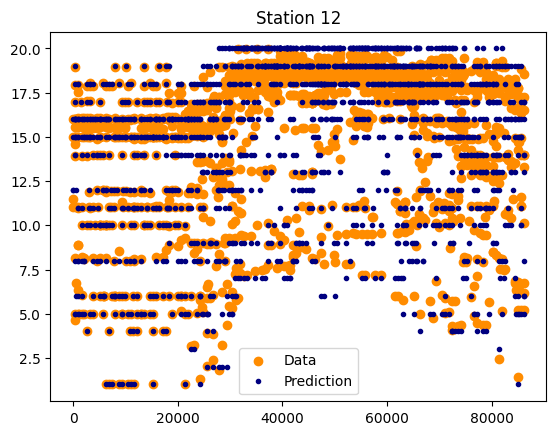

0.9751133714584139
83.33333333333334
<class 'pandas.core.frame.DataFrame'> 1650 1650


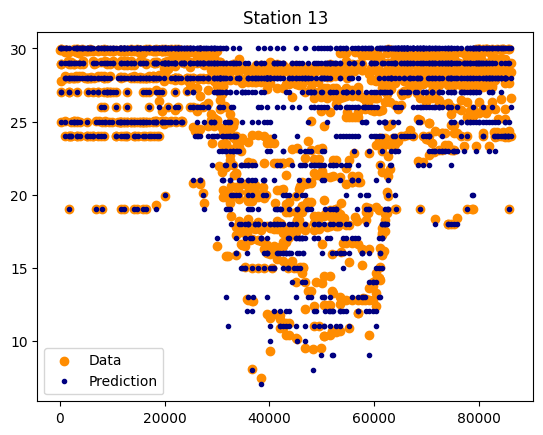

0.9051118759144308
46.839959225280325
<class 'pandas.core.frame.DataFrame'> 1962 1962


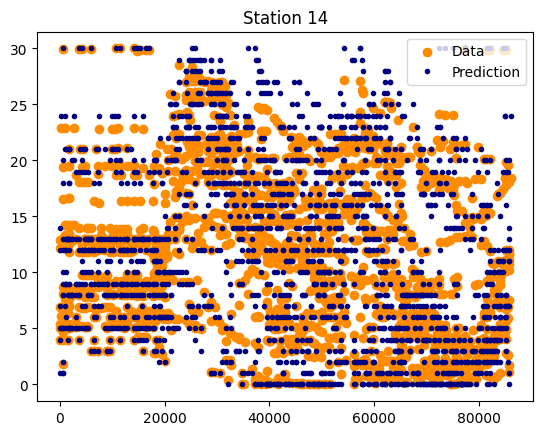

0.8698392877586978
65.3936545240893
<class 'pandas.core.frame.DataFrame'> 1702 1702


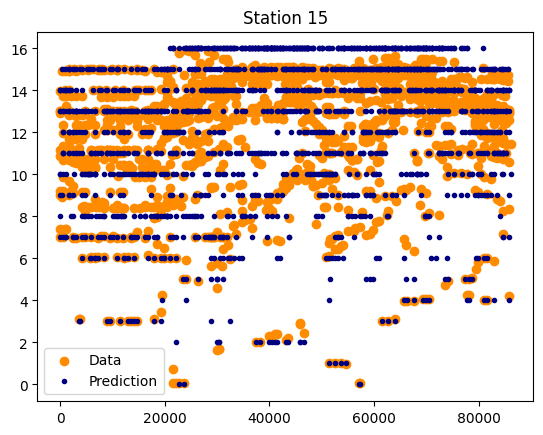

0.932549077102952
68.54304635761589
<class 'pandas.core.frame.DataFrame'> 1812 1812


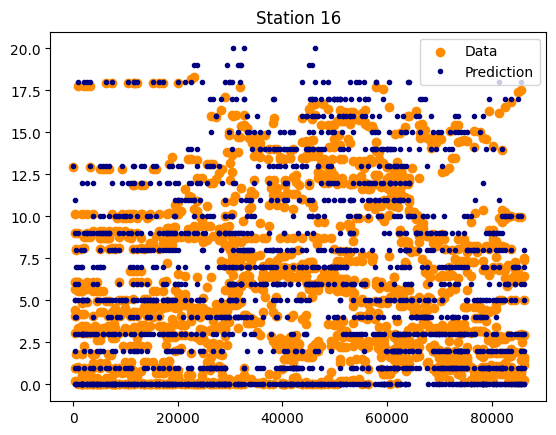

0.8981581599122109
79.00650502661148
<class 'pandas.core.frame.DataFrame'> 1691 1691


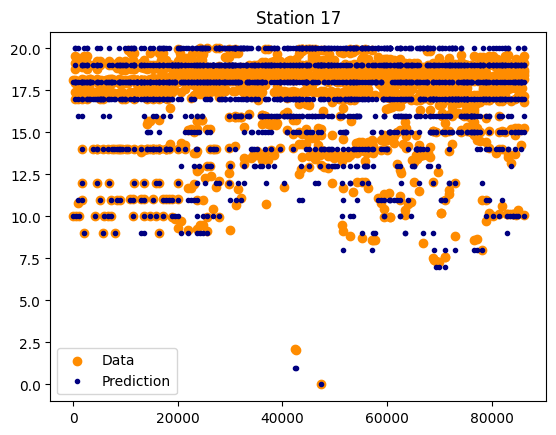

0.9354854819157853
54.43995963673057
<class 'pandas.core.frame.DataFrame'> 1982 1982


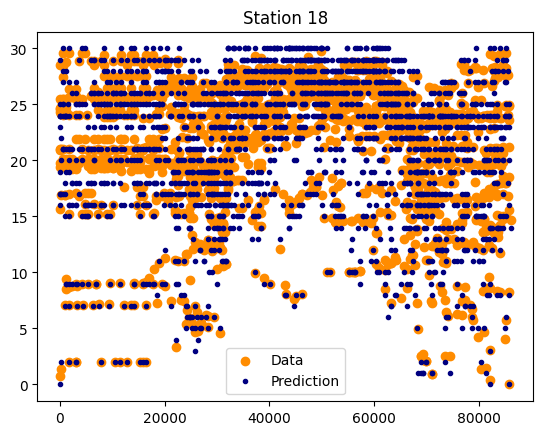

0.9569628184911392
58.29683698296837
<class 'pandas.core.frame.DataFrame'> 2055 2055


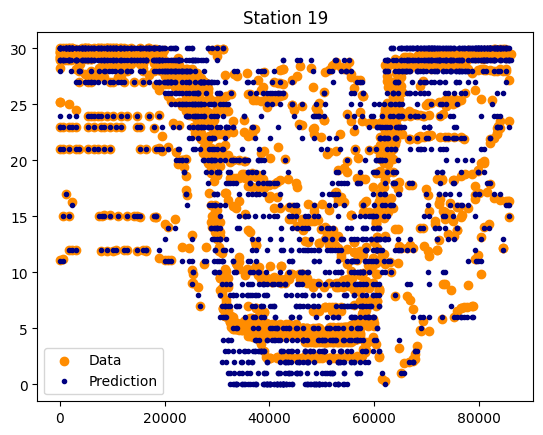

0.9610197050893015
69.31094383323682
<class 'pandas.core.frame.DataFrame'> 1727 1727


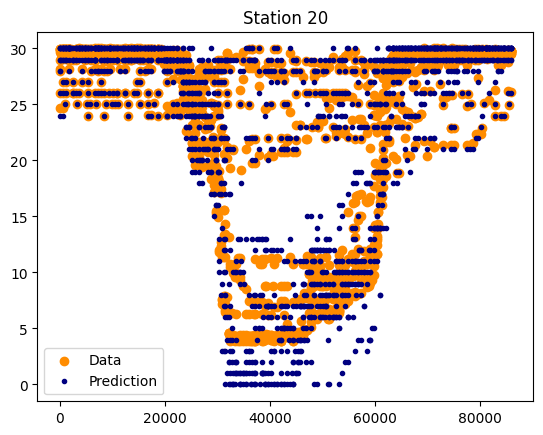

0.9430496953749437
55.78837087480356
<class 'pandas.core.frame.DataFrame'> 1909 1909


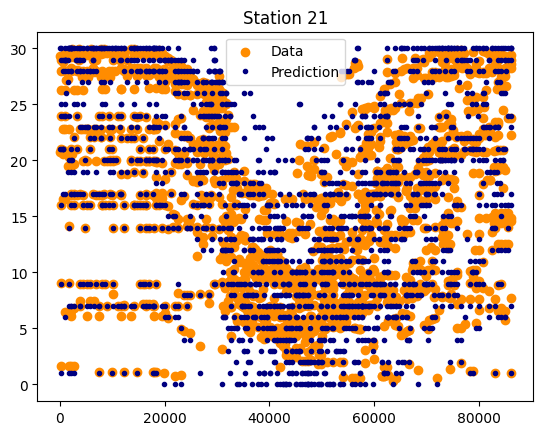

0.952212420863761
65.29562982005142
<class 'pandas.core.frame.DataFrame'> 1945 1945


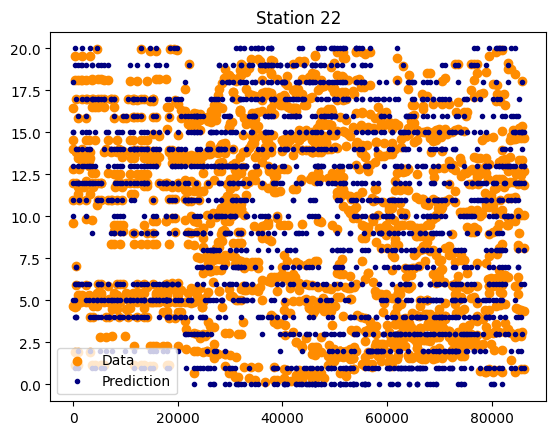

0.8880470522729412
60.07423117709438
<class 'pandas.core.frame.DataFrame'> 1886 1886


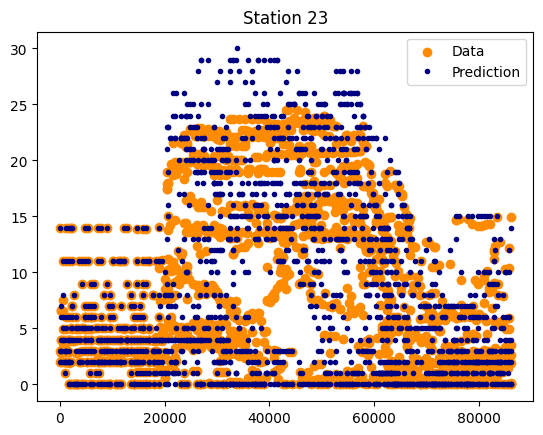

0.9166539004482165
53.071500503524675
<class 'pandas.core.frame.DataFrame'> 1986 1986


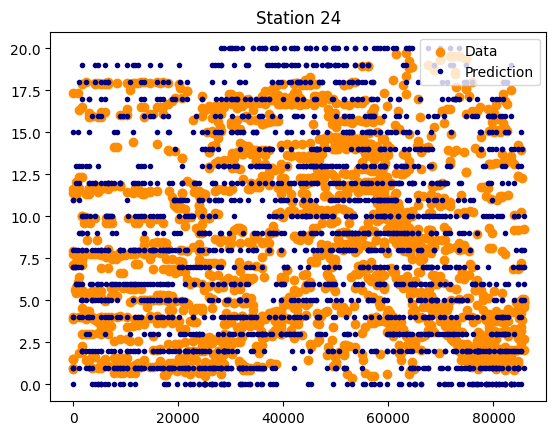

0.9620463820250399
75.08710801393728
<class 'pandas.core.frame.DataFrame'> 1722 1722


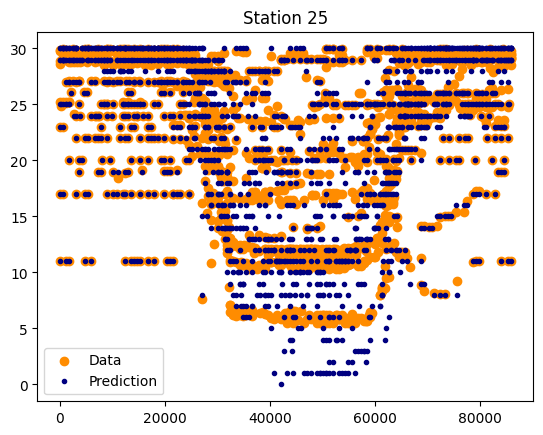

0.9595647756047972
69.46141032759579
<class 'pandas.core.frame.DataFrame'> 1801 1801


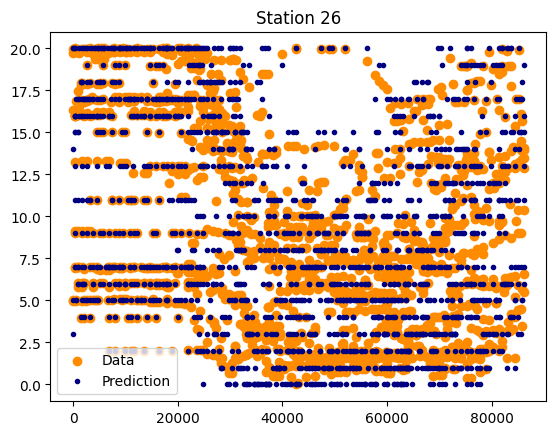

0.9444524730798217
63.98508257858284
<class 'pandas.core.frame.DataFrame'> 1877 1877


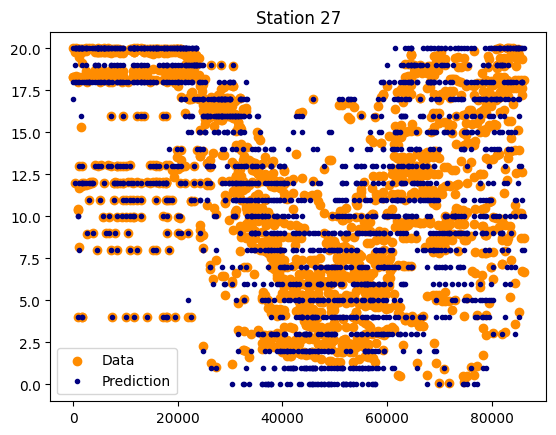

0.8568056912472639
52.35229759299781
<class 'pandas.core.frame.DataFrame'> 1828 1828


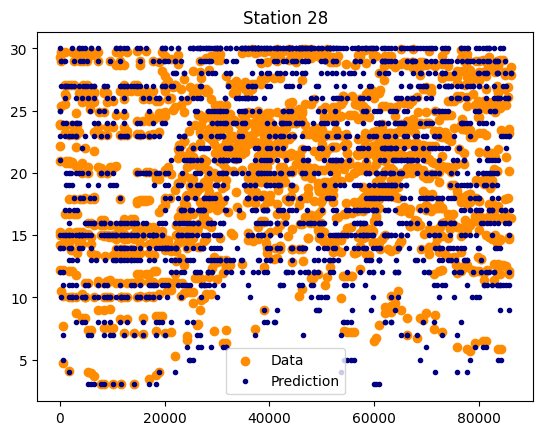

0.9066090669177571
49.596774193548384
<class 'pandas.core.frame.DataFrame'> 1984 1984


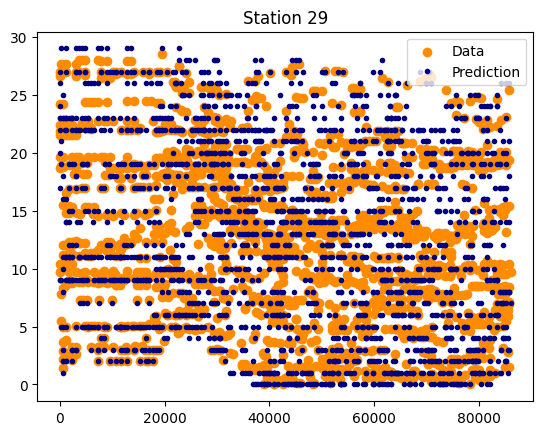

0.9780918610548928
90.9544603867748
<class 'pandas.core.frame.DataFrame'> 1603 1603


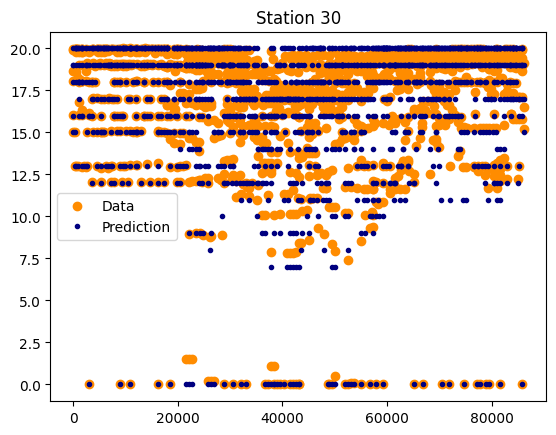

0.8759782370388038
56.110244409776385
<class 'pandas.core.frame.DataFrame'> 1923 1923


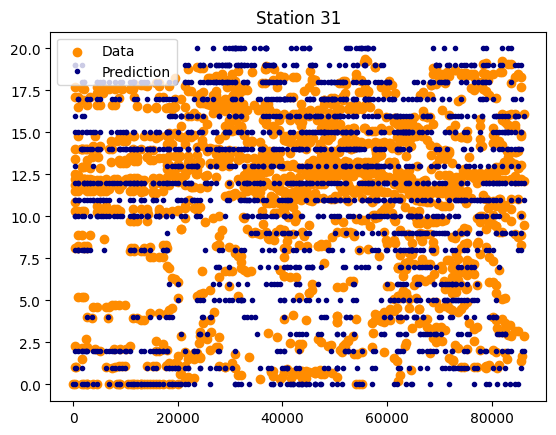

0.882576789783809
46.497764530551414
<class 'pandas.core.frame.DataFrame'> 2013 2013


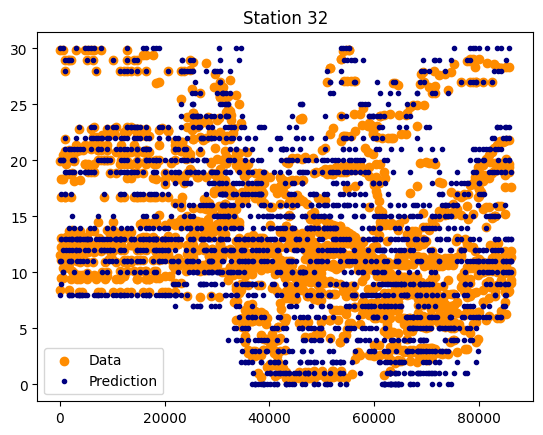

0.8084471911856825
41.67057719380573
<class 'pandas.core.frame.DataFrame'> 2131 2131


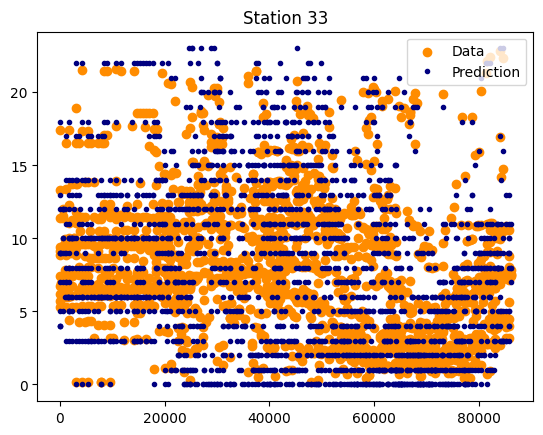

0.9471017527438141
44.12759787336878
<class 'pandas.core.frame.DataFrame'> 2069 2069


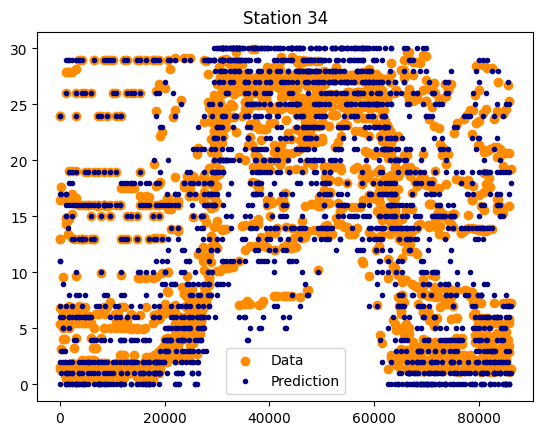

0.9768000686462457
61.41164348274085
<class 'pandas.core.frame.DataFrame'> 1941 1941


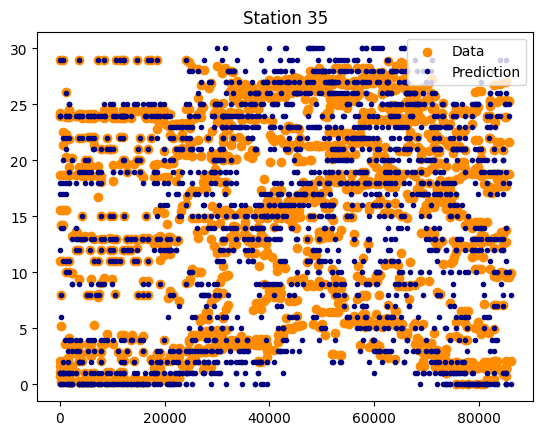

0.9062225466431859
55.66090351366425
<class 'pandas.core.frame.DataFrame'> 1793 1793


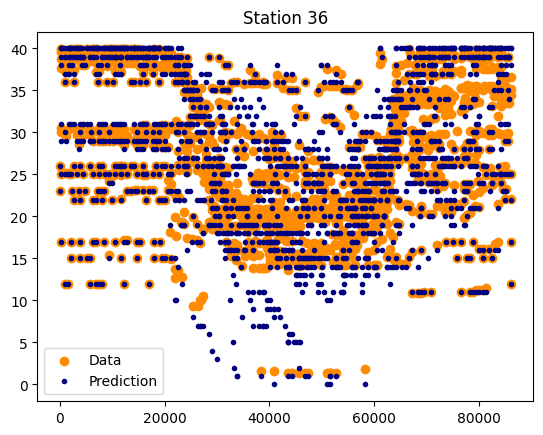

0.9813079967048207
83.97277227722772
<class 'pandas.core.frame.DataFrame'> 1616 1616


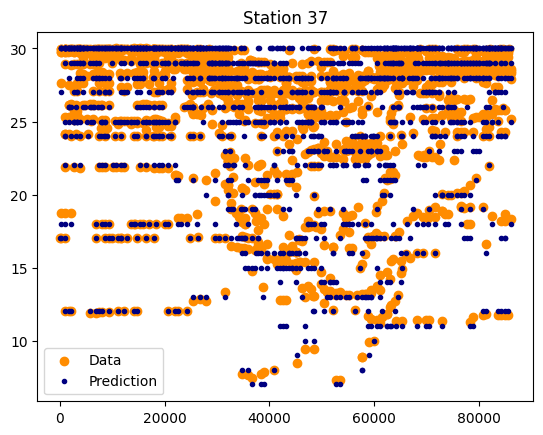

0.9056899793588897
46.793930494371025
<class 'pandas.core.frame.DataFrame'> 2043 2043


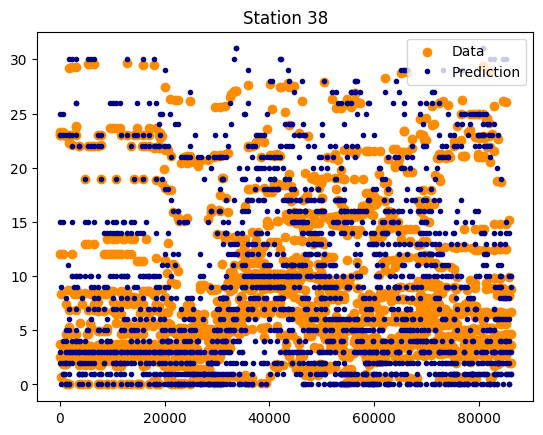

0.9008377429701807
64.70286885245902
<class 'pandas.core.frame.DataFrame'> 1952 1952


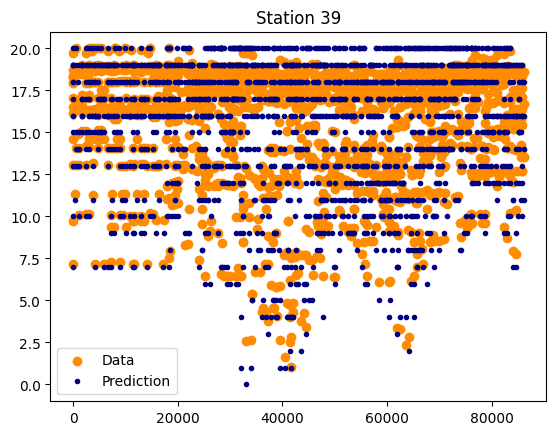

0.8956934553933417
54.199683042789225
<class 'pandas.core.frame.DataFrame'> 1893 1893


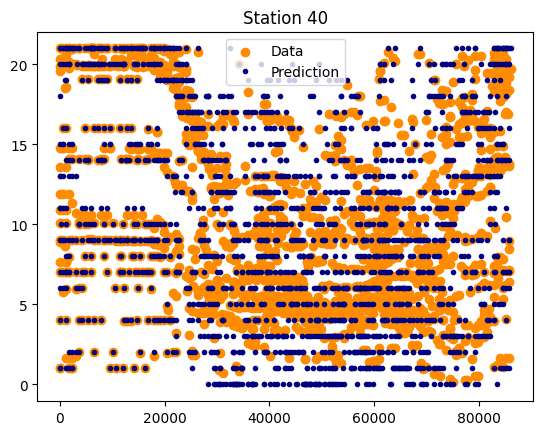

0.9654235505169396
80.50797401063201
<class 'pandas.core.frame.DataFrame'> 1693 1693


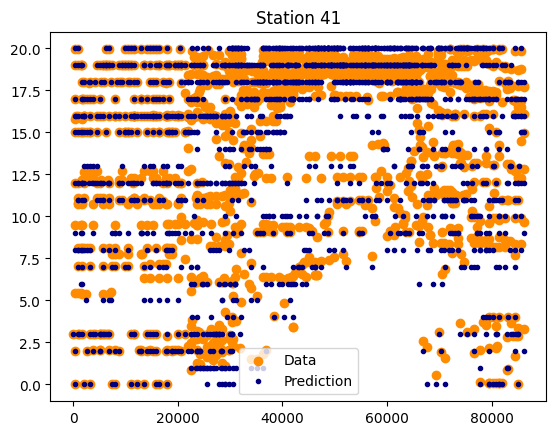

0.9654622340377103
63.19957761351637
<class 'pandas.core.frame.DataFrame'> 1894 1894


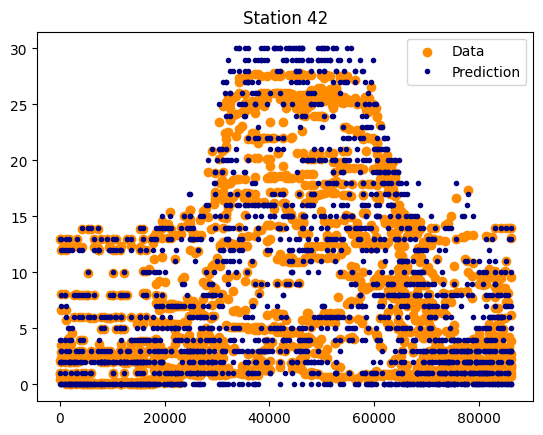

0.955702142262519
53.9760348583878
<class 'pandas.core.frame.DataFrame'> 1836 1836


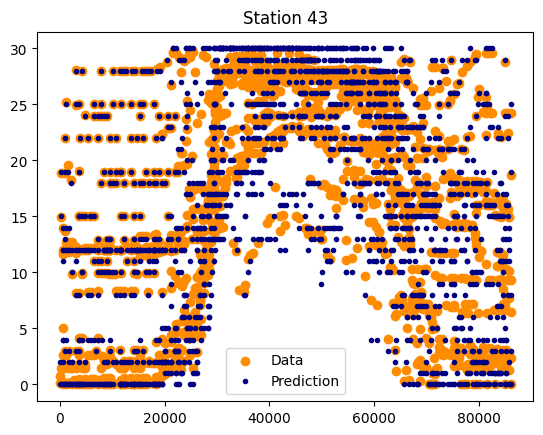

0.9568805484306261
60.822387207310115
<class 'pandas.core.frame.DataFrame'> 1751 1751


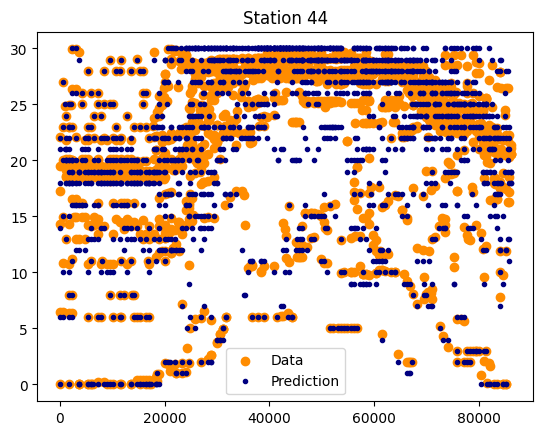

0.9505042705276939
54.963131026659106
<class 'pandas.core.frame.DataFrame'> 1763 1763


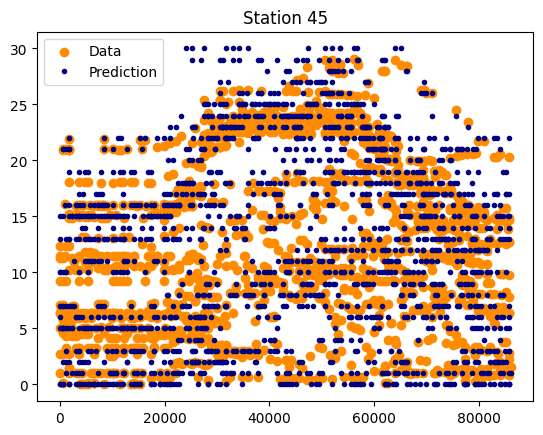

0.9477918651835316
79.78273989136994
<class 'pandas.core.frame.DataFrame'> 1657 1657


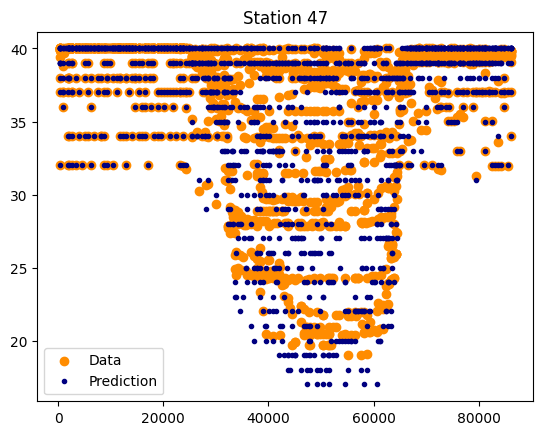

0.9844711003667002
72.09302325581395
<class 'pandas.core.frame.DataFrame'> 1849 1849


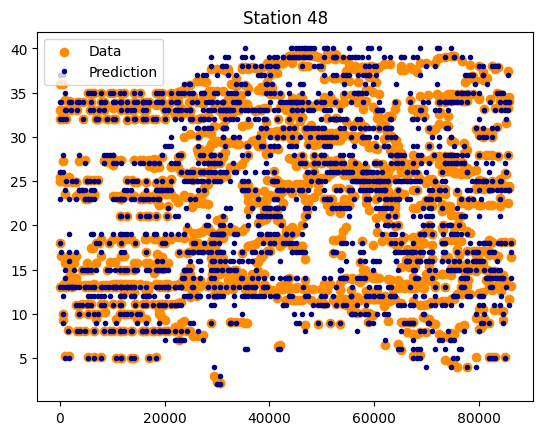

0.9698226032100807
59.79020979020979
<class 'pandas.core.frame.DataFrame'> 2002 2002


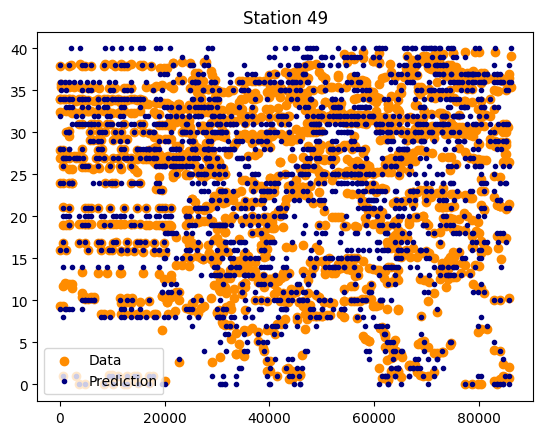

0.9836815919274866
62.22910216718266
<class 'pandas.core.frame.DataFrame'> 1938 1938


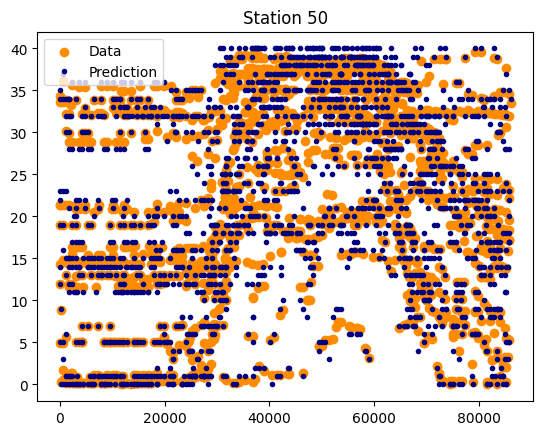

0.9814935857090774
80.25928108426635
<class 'pandas.core.frame.DataFrame'> 1697 1697


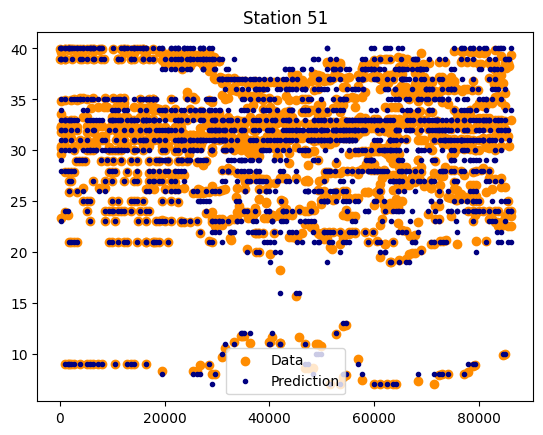

0.9877644961162737
78.30188679245283
<class 'pandas.core.frame.DataFrame'> 1590 1590


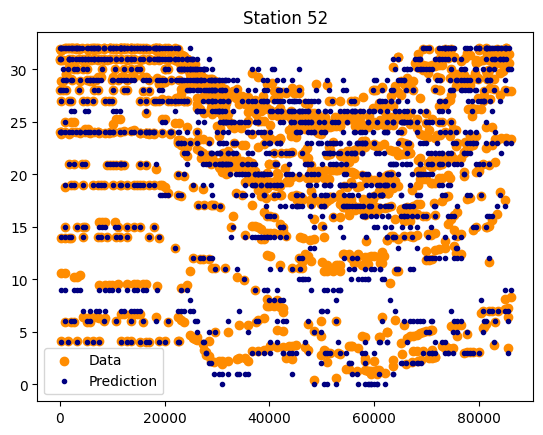

0.9804529936189058
83.6875
<class 'pandas.core.frame.DataFrame'> 1600 1600


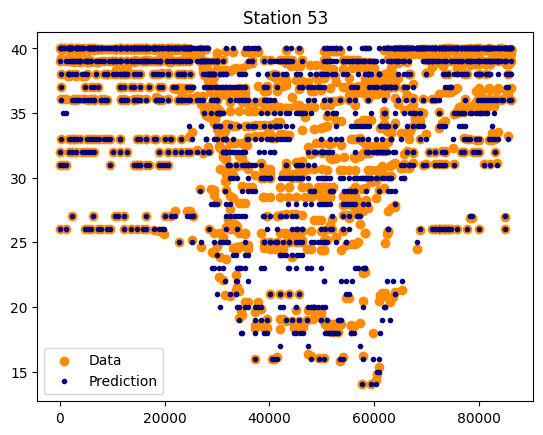

0.9825880408103823
76.11853573503777
<class 'pandas.core.frame.DataFrame'> 1721 1721


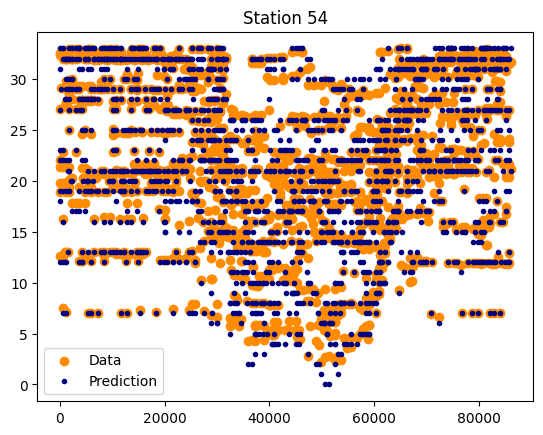

0.966203079236199
74.59749552772809
<class 'pandas.core.frame.DataFrame'> 1677 1677


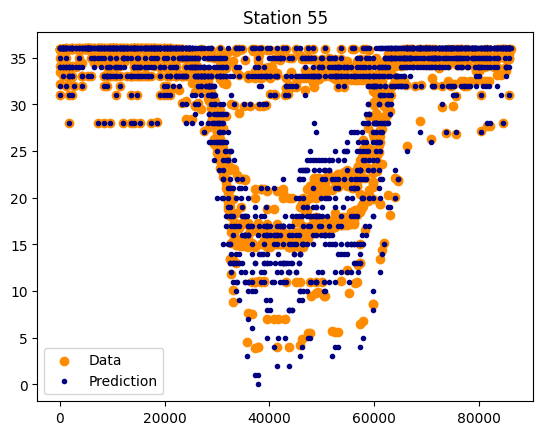

0.980164618607001
64.53100973859559
<class 'pandas.core.frame.DataFrame'> 1951 1951


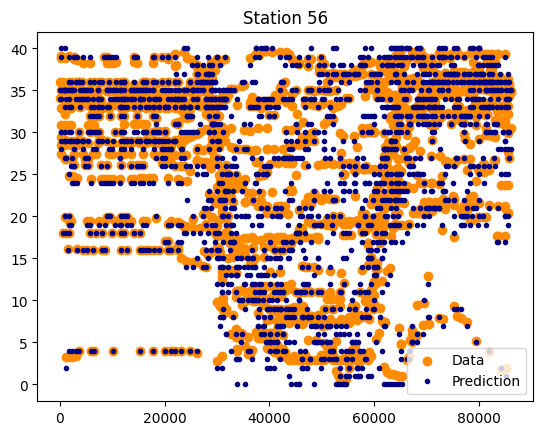

0.9365692078952337
72.18268090154211
<class 'pandas.core.frame.DataFrame'> 1686 1686


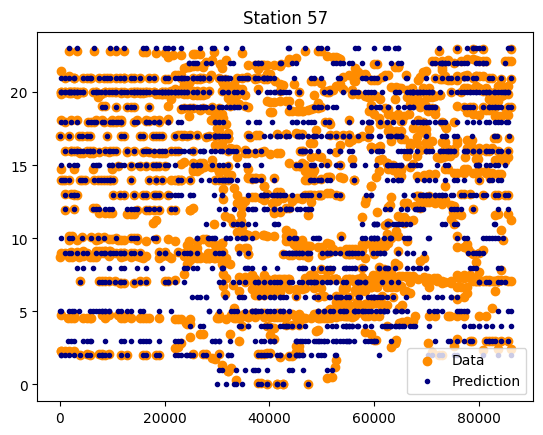

0.9447953804771405
50.38572806171649
<class 'pandas.core.frame.DataFrame'> 2074 2074


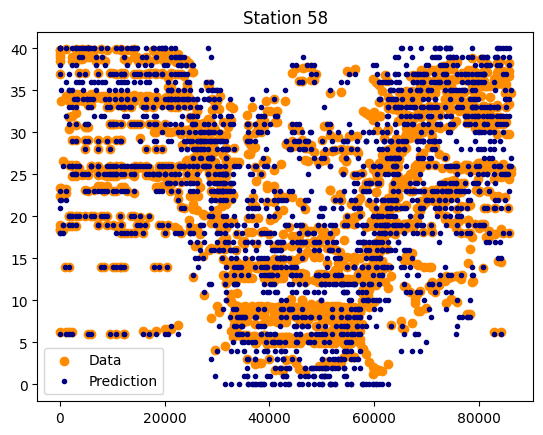

0.942531290836617
80.39099526066352
<class 'pandas.core.frame.DataFrame'> 1688 1688


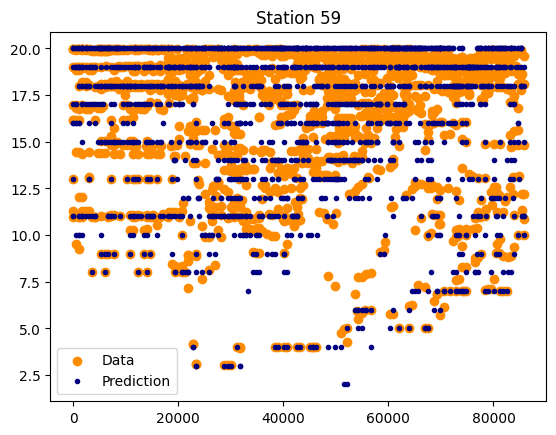

0.9423231028836301
50.567010309278345
<class 'pandas.core.frame.DataFrame'> 1940 1940


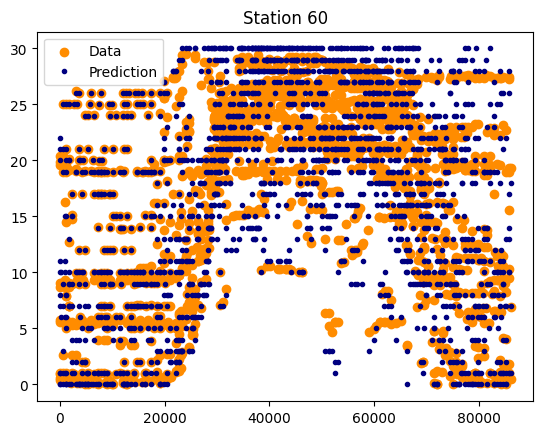

0.9643347383814941
81.37973137973138
<class 'pandas.core.frame.DataFrame'> 1638 1638


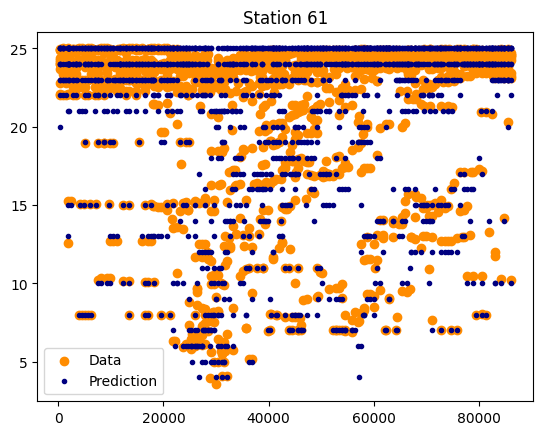

0.9559380100891304
57.37439222042139
<class 'pandas.core.frame.DataFrame'> 1851 1851


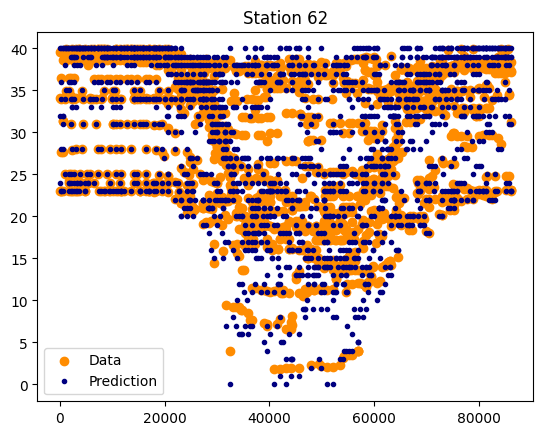

0.9570157543508981
69.90508096035735
<class 'pandas.core.frame.DataFrame'> 1791 1791


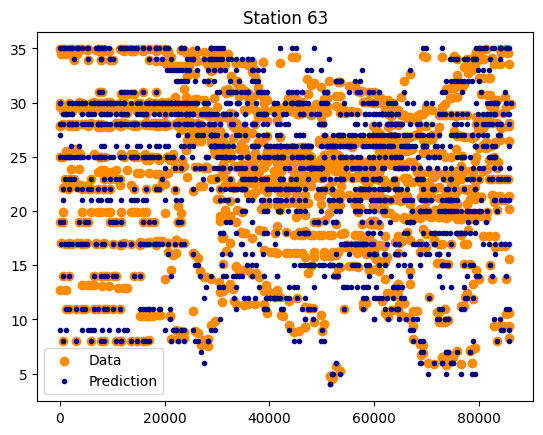

0.959478698167631
60.14606155451225
<class 'pandas.core.frame.DataFrame'> 1917 1917


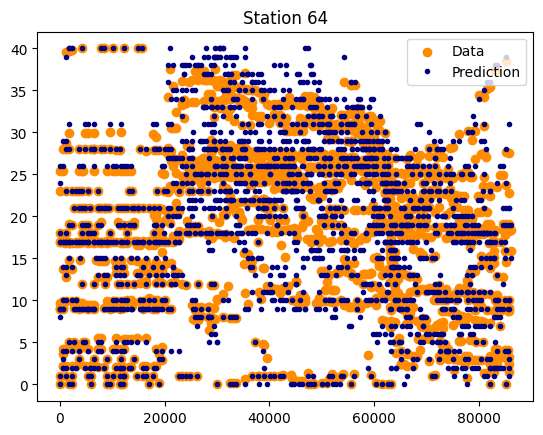

0.9402687226746019
56.242424242424235
<class 'pandas.core.frame.DataFrame'> 1650 1650


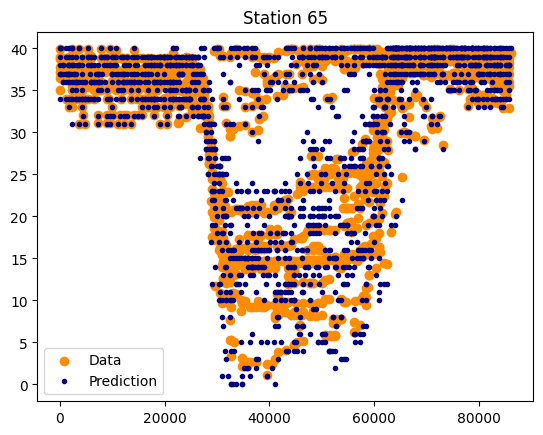

0.9496924173052852
59.171597633136095
<class 'pandas.core.frame.DataFrame'> 1859 1859


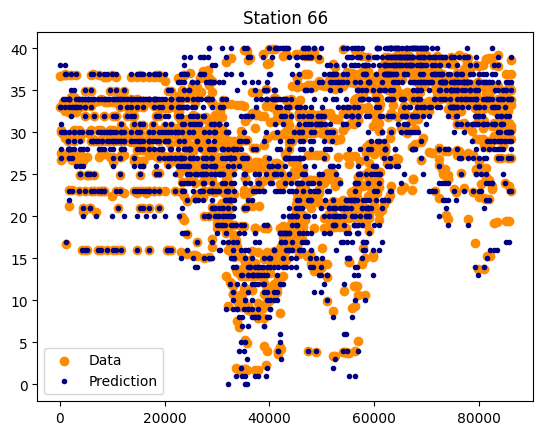

0.9395881448830665
48.2311908320877
<class 'pandas.core.frame.DataFrame'> 2007 2007


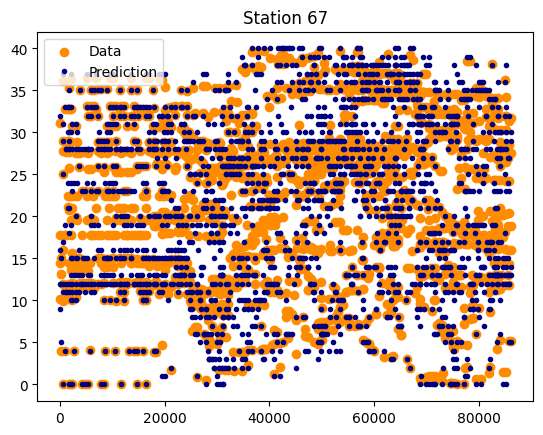

0.9685147942163331
55.373947498761765
<class 'pandas.core.frame.DataFrame'> 2019 2019


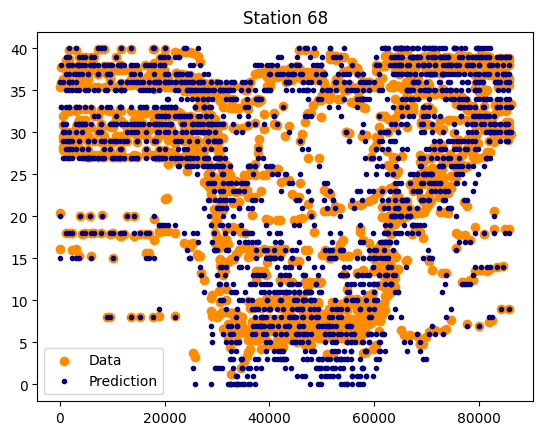

0.9467732837084286
47.22098710538017
<class 'pandas.core.frame.DataFrame'> 2249 2249


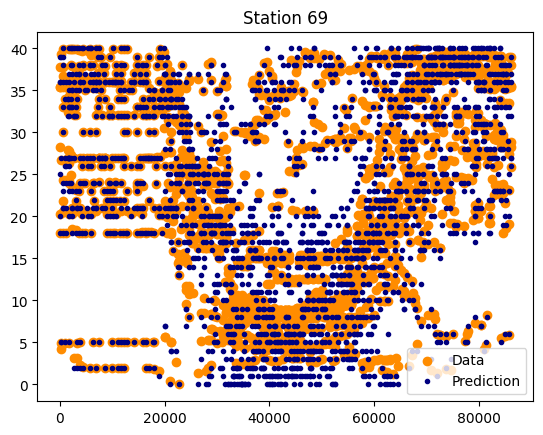

0.9525652704379628
67.22037652270211
<class 'pandas.core.frame.DataFrame'> 1806 1806


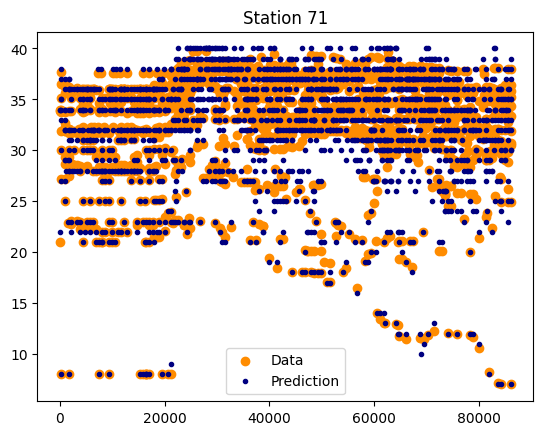

0.9317504745280824
66.81715575620768
<class 'pandas.core.frame.DataFrame'> 1772 1772


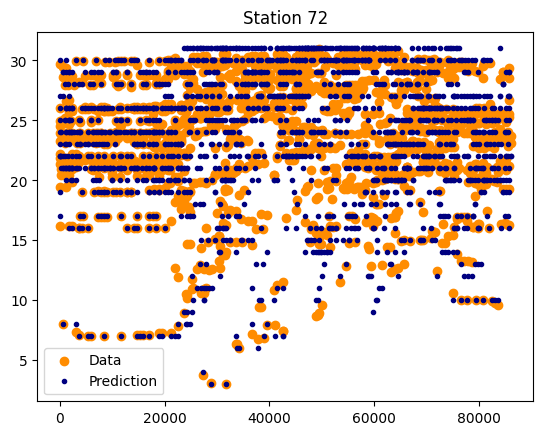

0.9447847072866142
62.7906976744186
<class 'pandas.core.frame.DataFrame'> 1849 1849


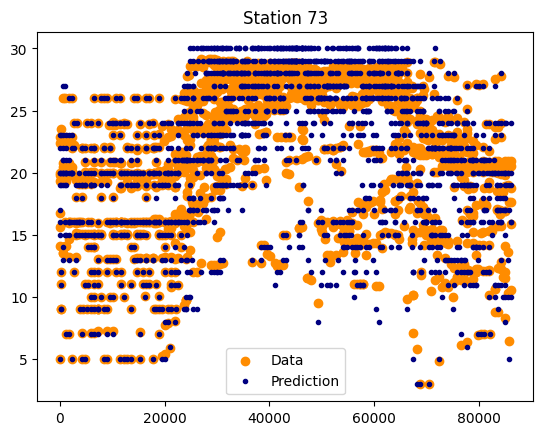

0.9752400025317945
67.85508913168488
<class 'pandas.core.frame.DataFrame'> 1739 1739


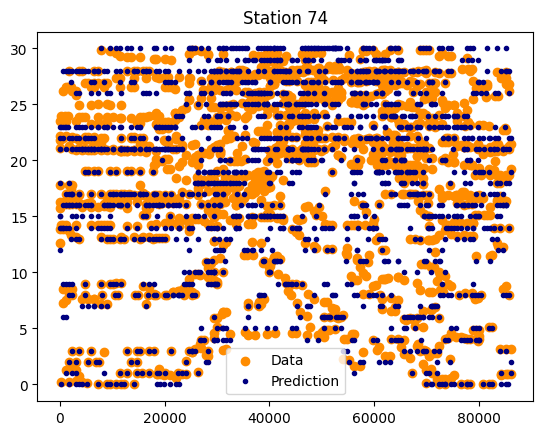

0.9820718148858557
75.16629711751663
<class 'pandas.core.frame.DataFrame'> 1804 1804


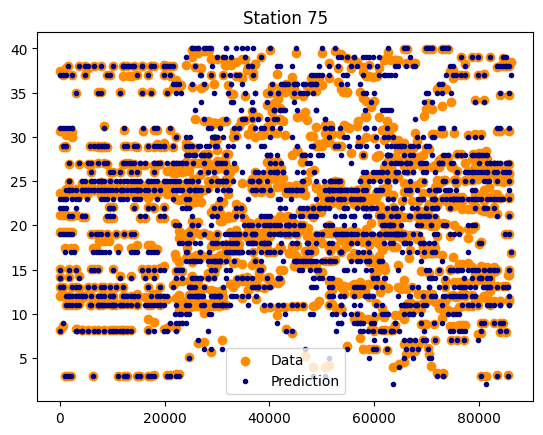

0.9586589797985225
63.59393232205367
<class 'pandas.core.frame.DataFrame'> 1714 1714


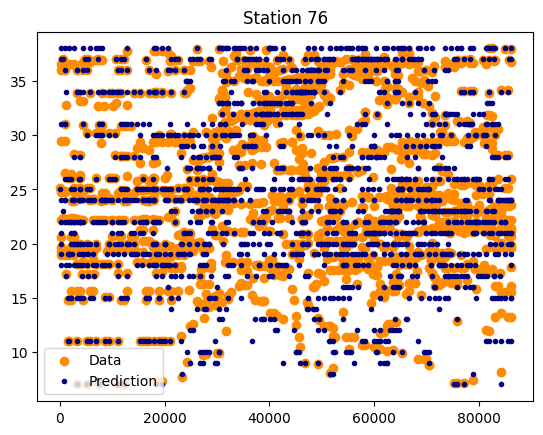

0.9629259773953648
63.88589881593111
<class 'pandas.core.frame.DataFrame'> 1858 1858


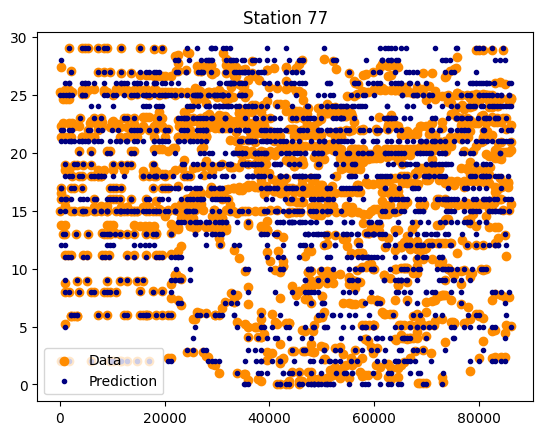

0.9754882569552054
75.85812356979405
<class 'pandas.core.frame.DataFrame'> 1748 1748


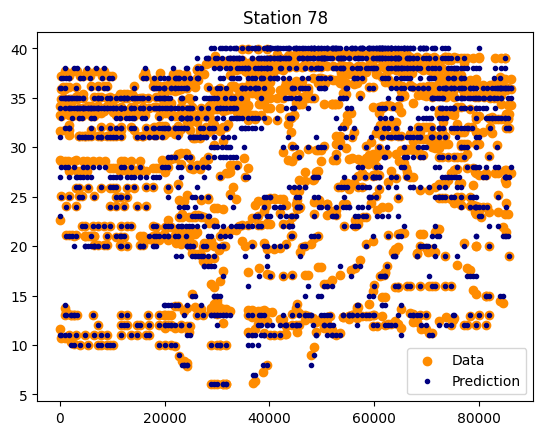

0.9543648125605984
86.70483460559797
<class 'pandas.core.frame.DataFrame'> 1572 1572


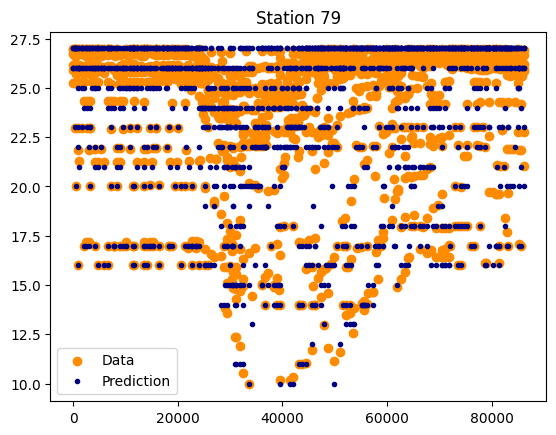

0.9106457603225355
47.26027397260274
<class 'pandas.core.frame.DataFrame'> 1752 1752


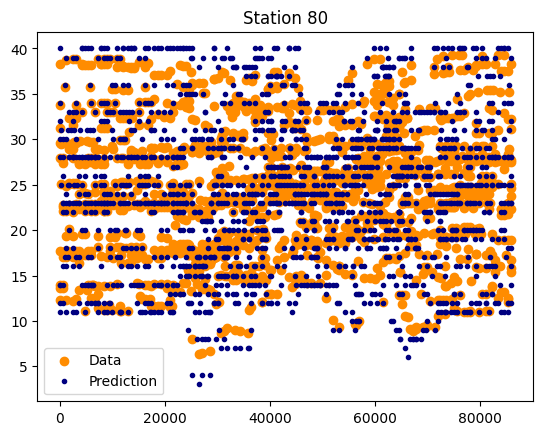

0.9867983144648449
86.82411435674332
<class 'pandas.core.frame.DataFrame'> 1609 1609


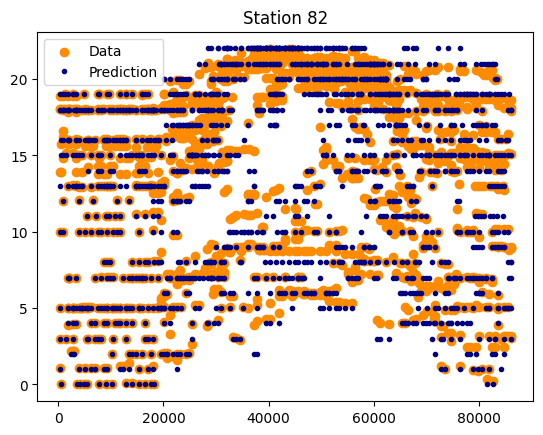

0.9595154480159815
60.160734787600454
<class 'pandas.core.frame.DataFrame'> 1742 1742


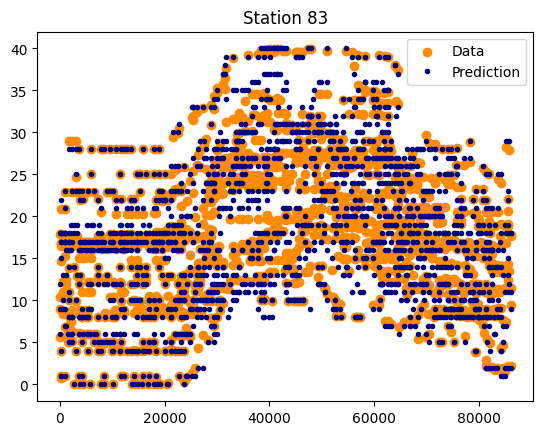

0.9803347365109428
79.81873111782477
<class 'pandas.core.frame.DataFrame'> 1655 1655


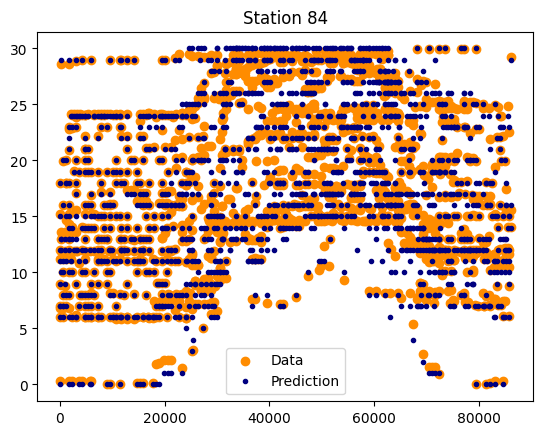

0.965930327996459
71.12144102266124
<class 'pandas.core.frame.DataFrame'> 1721 1721


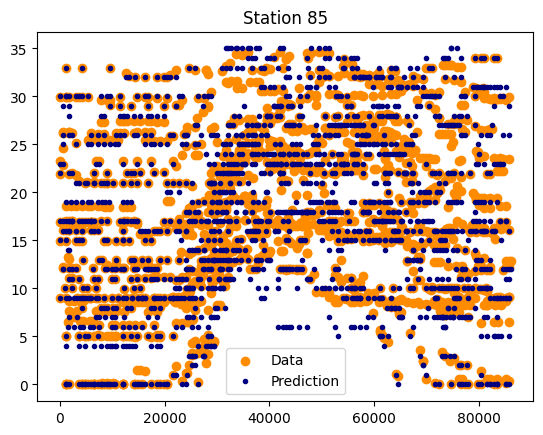

0.9730459353428694
64.05158516926383
<class 'pandas.core.frame.DataFrame'> 1861 1861


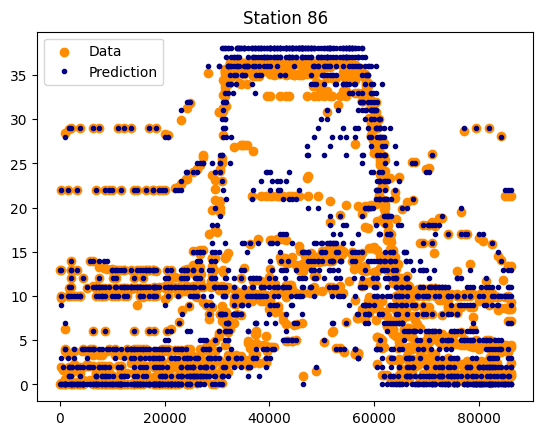

0.9788692942877695
72.04362801377727
<class 'pandas.core.frame.DataFrame'> 1742 1742


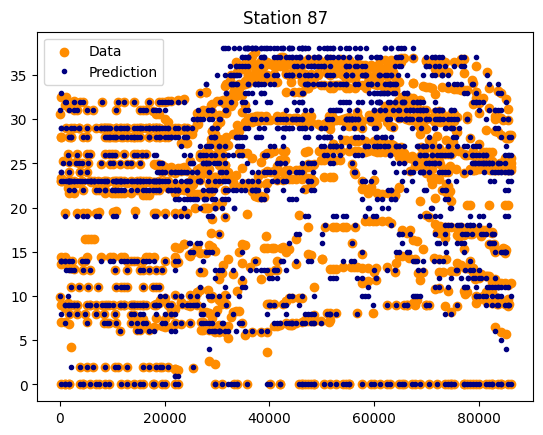

0.9785681223799134
72.32142857142857
<class 'pandas.core.frame.DataFrame'> 1792 1792


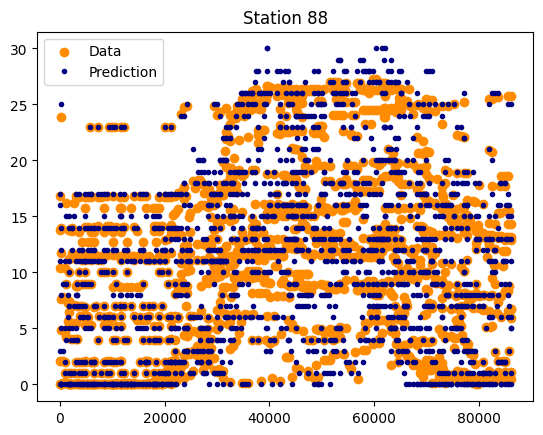

0.9474428870580164
83.49875930521092
<class 'pandas.core.frame.DataFrame'> 1612 1612


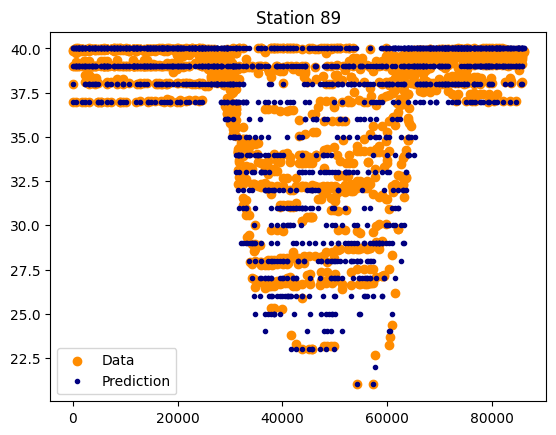

0.9585418168724494
60.858189429618
<class 'pandas.core.frame.DataFrame'> 1911 1911


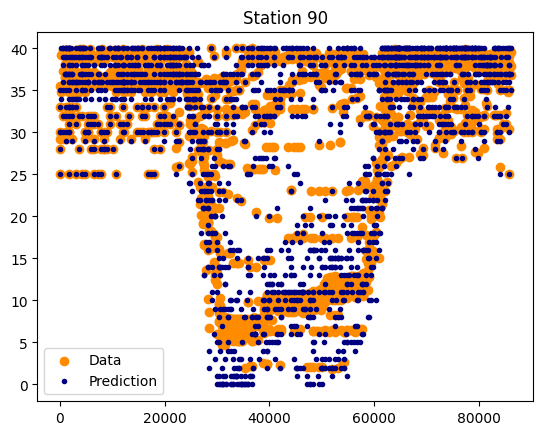

0.9193278633372148
48.85343968095713
<class 'pandas.core.frame.DataFrame'> 2006 2006


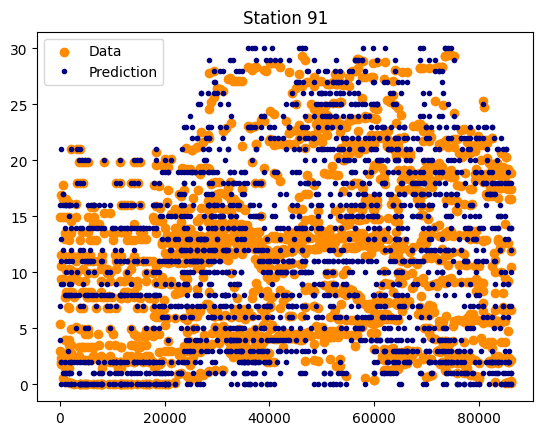

0.9753142271658959
68.68131868131869
<class 'pandas.core.frame.DataFrame'> 1820 1820


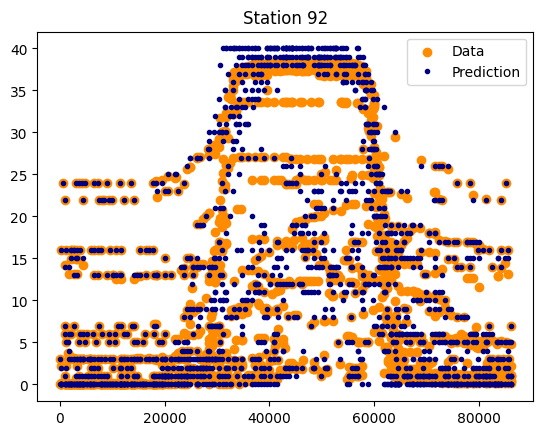

0.9832535938375853
80.90361445783132
<class 'pandas.core.frame.DataFrame'> 1660 1660


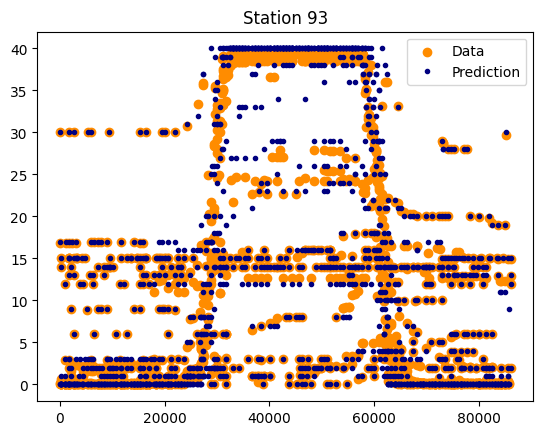

0.9938817126475054
90.47619047619048
<class 'pandas.core.frame.DataFrame'> 1617 1617


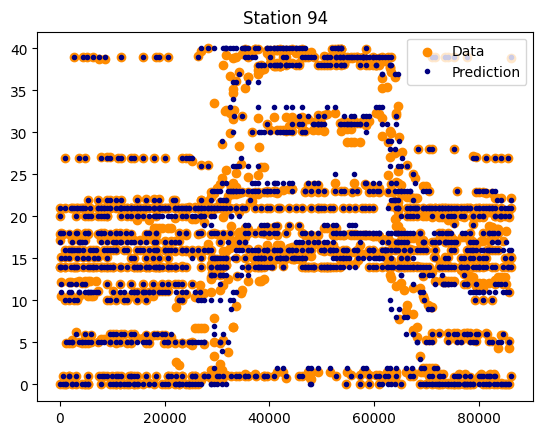

0.9525245521529052
64.43719412724307
<class 'pandas.core.frame.DataFrame'> 1839 1839


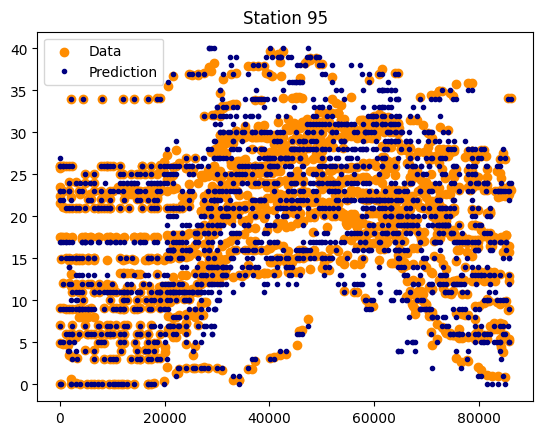

0.9767327849377602
81.66563082660038
<class 'pandas.core.frame.DataFrame'> 1609 1609


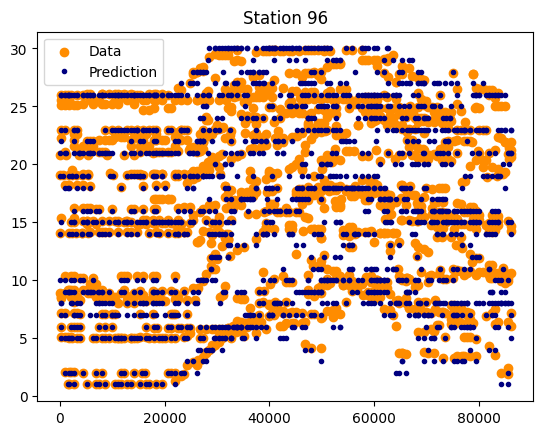

0.9382770951796309
57.56893640967924
<class 'pandas.core.frame.DataFrame'> 1777 1777


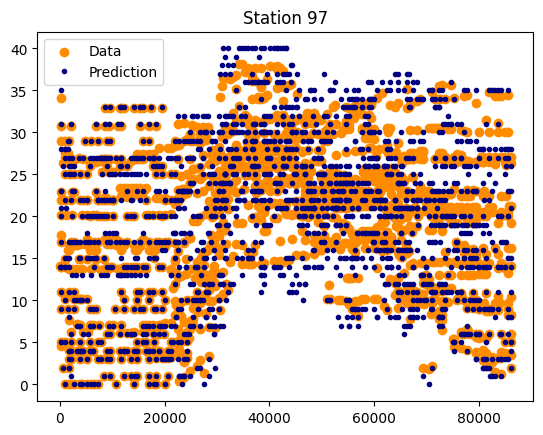

0.9851795092206683
74.44959443800695
<class 'pandas.core.frame.DataFrame'> 1726 1726


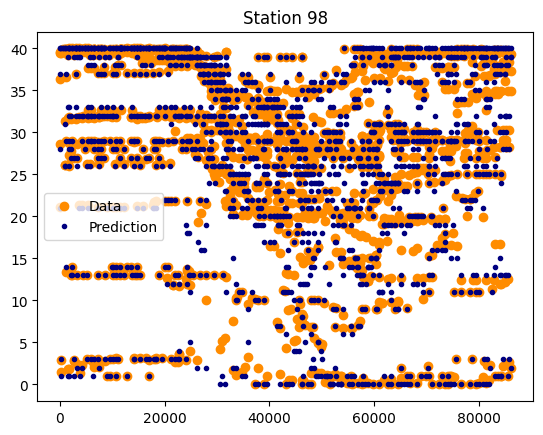

0.9798982171122972
77.68739105171412
<class 'pandas.core.frame.DataFrame'> 1721 1721


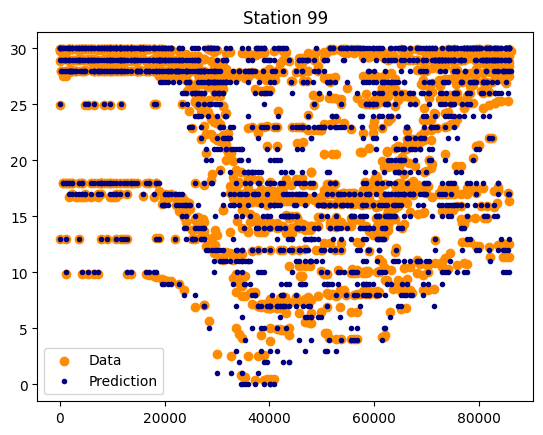

0.9509227064027774
65.95159515951595
<class 'pandas.core.frame.DataFrame'> 1818 1818


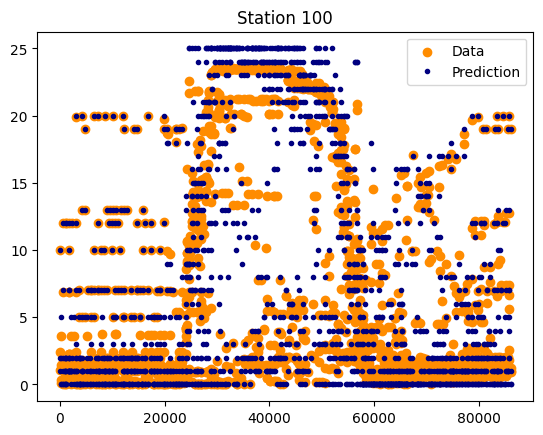

0.9588287046877594
62.292358803986716
<class 'pandas.core.frame.DataFrame'> 1806 1806


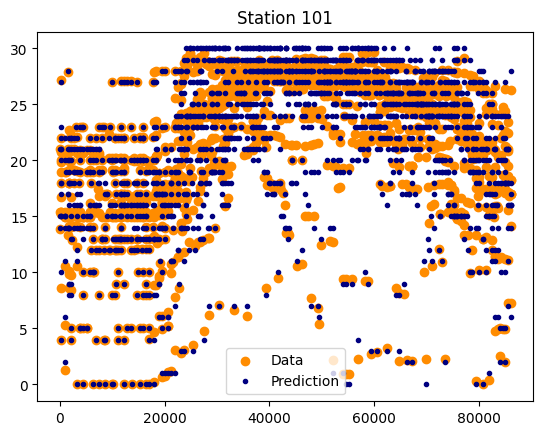

0.9133987481268806
62.14925373134328
<class 'pandas.core.frame.DataFrame'> 1675 1675


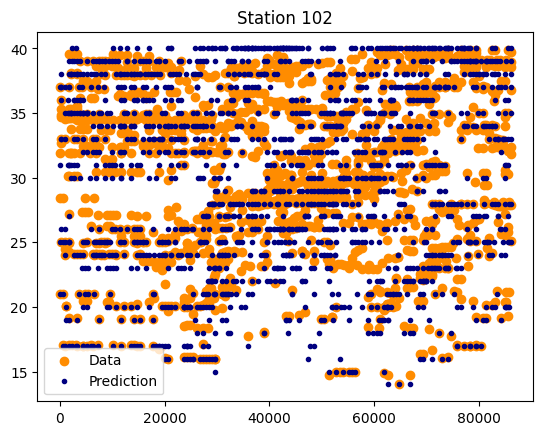

0.9684078397527472
82.63509411050394
<class 'pandas.core.frame.DataFrame'> 1647 1647


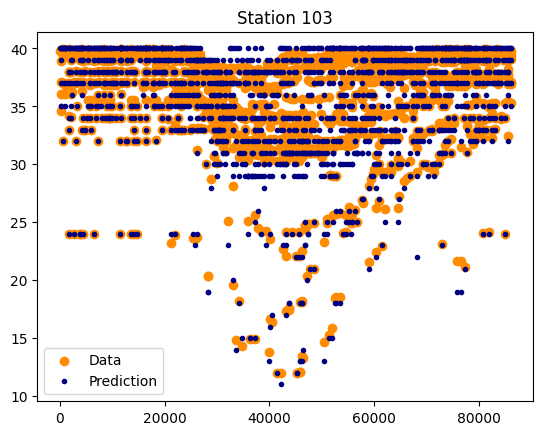

0.9786808455505495
87.36299161831077
<class 'pandas.core.frame.DataFrame'> 1551 1551


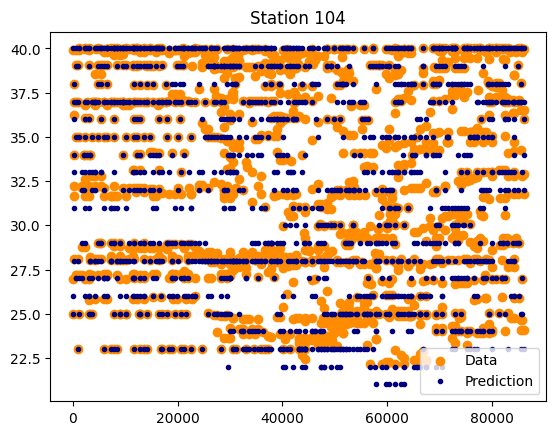

0.9794813054479983
82.24181360201511
<class 'pandas.core.frame.DataFrame'> 1588 1588


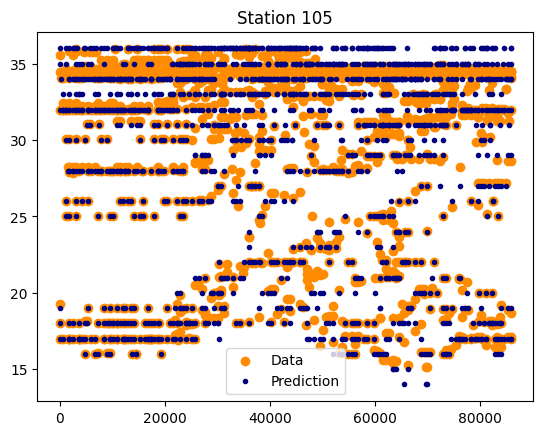

0.9021045361912883
62.20095693779905
<class 'pandas.core.frame.DataFrame'> 1672 1672


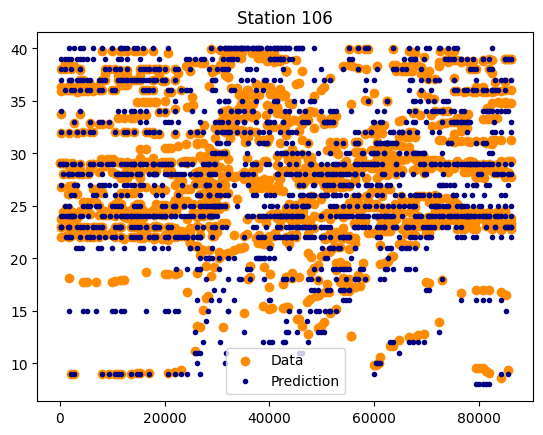

0.9545938318873239
63.1731325998842
<class 'pandas.core.frame.DataFrame'> 1727 1727


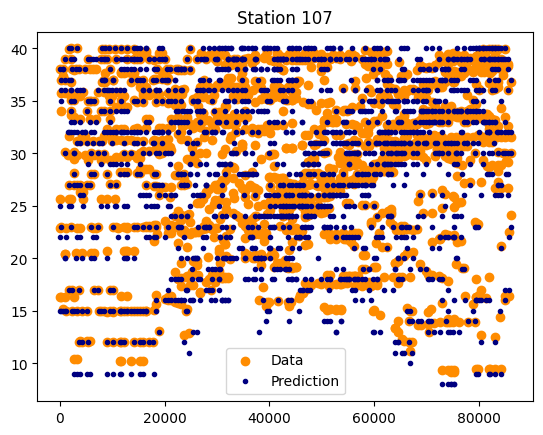

0.9363839055392098
63.65217391304348
<class 'pandas.core.frame.DataFrame'> 1725 1725


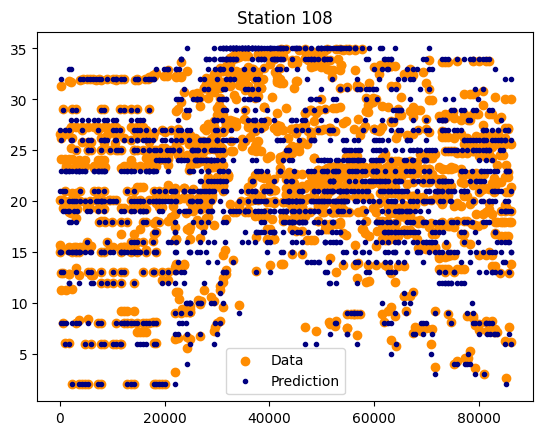

0.9295141351380527
68.73589164785552
<class 'pandas.core.frame.DataFrame'> 1772 1772


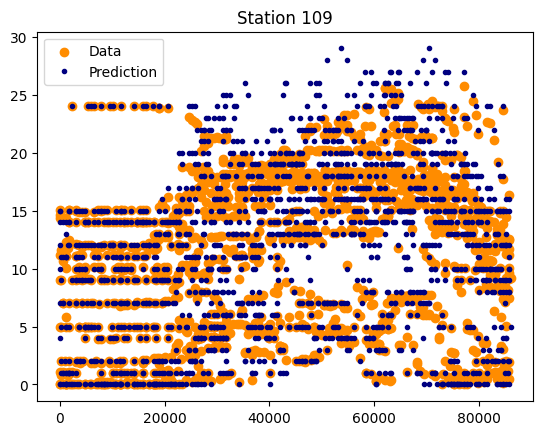

0.9603256036174324
74.05632115038946
<class 'pandas.core.frame.DataFrame'> 1669 1669


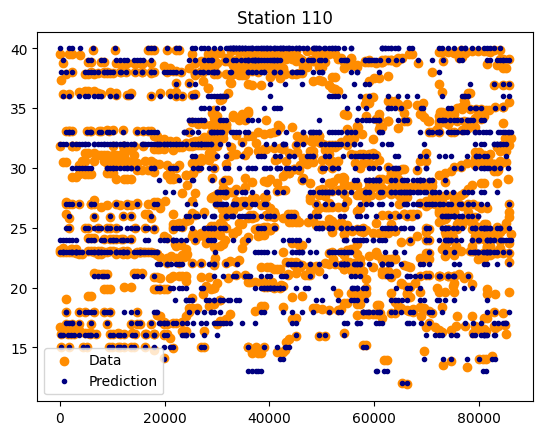

0.9525022228958345
72.64623955431755
<class 'pandas.core.frame.DataFrame'> 1795 1795


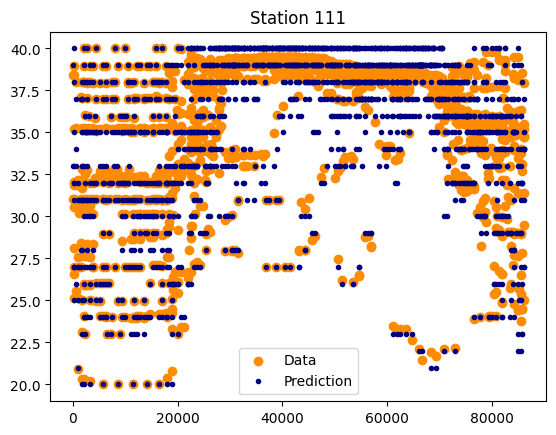

0.9519259034861461
50.6198347107438
<class 'pandas.core.frame.DataFrame'> 1936 1936


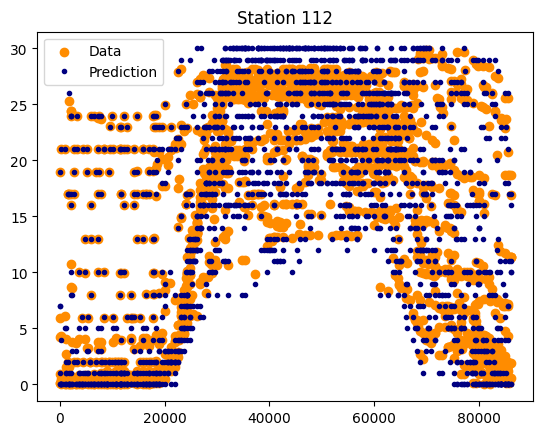

0.9854823019133853
85.21522145976294
<class 'pandas.core.frame.DataFrame'> 1603 1603


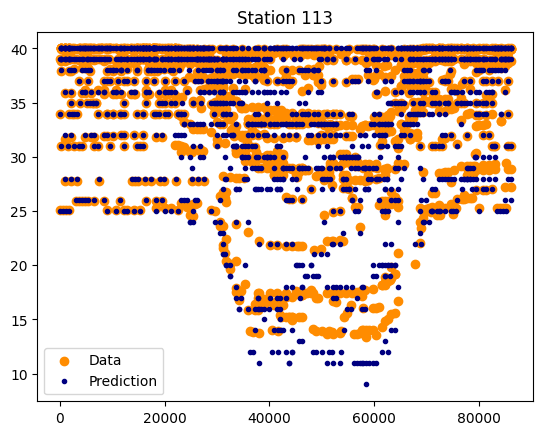

0.9368250361504056
61.29550321199143
<class 'pandas.core.frame.DataFrame'> 1868 1868


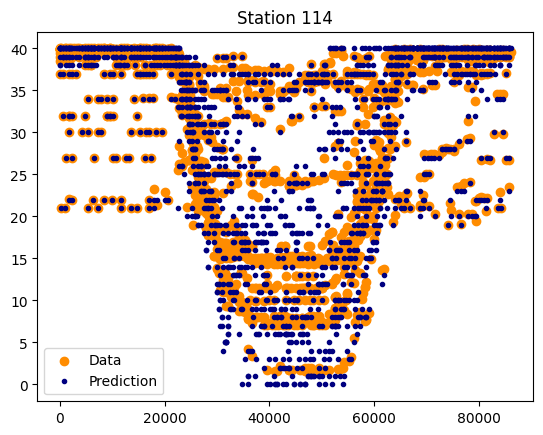

0.9437543265428855
60.20565552699229
<class 'pandas.core.frame.DataFrame'> 1945 1945


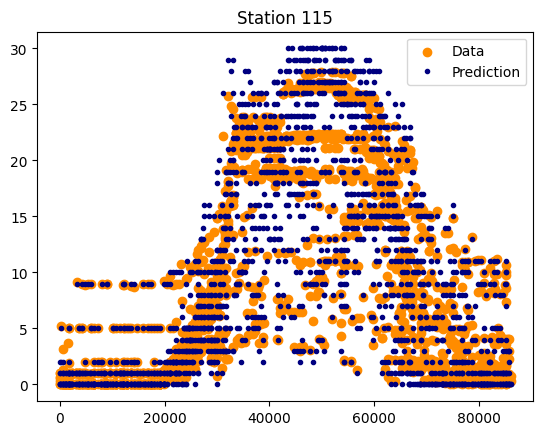

In [22]:
predictions = []
per = []
with PdfPages('RandForeststation_plots.pdf') as pdf:
    for num in station_number:
        x_set_num = x_set.loc[x_set['number'] == num]
        y_set_num = y_set[x_set['number'] == num]
        x_set_num.drop('number',axis=1)
        #scaler = StandardScaler()
        #x_scaled = scaler.fit_transform(x_set_num)
        #print(x_set_num.shape[0])
        highest  = y_set_num.max()
        x_train, x_test, y_train, y_test = train_test_split(x_set_num, y_set_num, test_size=0.33, random_state=42)
        regr = RandomForestRegressor(max_depth=10, random_state=4)
        regr.fit(x_train, y_train)
        y_pred = regr.predict(x_test)
        #predictions[num] = y_pred
        count = 0
        for i in range(len(y_pred)):
            if abs(y_pred[i] - y_test.iloc[i]) <= 1:
                count += 1
        print(r_squared(y_test, y_pred))
        print(count / len(y_pred) * 100)
        print(type(x_test),y_pred.size,y_test.shape[0])
        per.append(count / len(y_pred) * 100)
        plt.figure()
        plt.scatter(x_test['time_as_fraction'], y_pred, color="darkorange", label="Data")
        plt.plot(x_test['time_as_fraction'], y_test.to_numpy(), 'o', color="navy", label="Prediction", markersize=3)
        plt.axis("tight")
        plt.title(f"Station {num}")
        plt.legend()
        pdf.savefig()
        plt.show()